In [2]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from shapely import wkt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from transformers import pipeline
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

## Data Load/Clean

In [3]:
crime_df = pd.read_csv('data/Police_Department_Incident_Reports__Historical_2016_to_May_2018.csv')
crime_df.head()

,PdId,IncidntNum,Incident Code,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,location
0,16072741510045,160727415,10045,EMBEZZLEMENT,"EMBEZZLEMENT, GRAND THEFT BY EMPLOYEE",Friday,01/01/2016,00:01,INGLESIDE,NONE,5700 Block of MISSION ST,-122.450297,37.709552,POINT (-122.45029719777277 37.70955194084215)
1,16600299606372,166002996,6372,LARCENY/THEFT,PETTY THEFT OF PROPERTY,Friday,01/01/2016,13:40,CENTRAL,NONE,JEFFERSON ST / MASON ST,-122.414167,37.808420,POINT (-122.41416651509333 37.808419917270975)
2,17015398506304,170153985,6304,LARCENY/THEFT,GRAND THEFT FROM A BUILDING,Friday,01/01/2016,00:01,BAYVIEW,NONE,100 Block of APOLLO ST,-122.398745,37.730854,POINT (-122.3987447553861 37.730854021807374)
3,16063185010015,160631850,10015,EMBEZZLEMENT,"EMBEZZLEMENT, GRAND THEFT",Friday,01/01/2016,12:00,BAYVIEW,NONE,4000 Block of 3RD ST,-122.388753,37.740736,POINT (-122.38875304699722 37.74073605483584)
4,16020260575030,160202605,75030,NON-CRIMINAL,CASE CLOSURE,Friday,01/01/2016,12:00,CENTRAL,UNFOUNDED,2700 Block of HYDE ST,-122.420535,37.806189,POINT (-122.4205346782714 37.8061892244521)


In [4]:
crime_df['Date'] = pd.to_datetime(crime_df['Date'])

In [5]:
crime_df.dtypes

PdId                      int64
IncidntNum                int64
Incident Code             int64
Category                 object
Descript                 object
DayOfWeek                object
Date             datetime64[ns]
Time                     object
PdDistrict               object
Resolution               object
Address                  object
X                       float64
Y                       float64
location                 object
dtype: object

In [6]:
crime_df = crime_df.drop(columns=['PdId', 'IncidntNum', 'Incident Code', 'Address', 'location'])

In [7]:
crime_df.columns

Index(['Category', 'Descript', 'DayOfWeek', 'Date', 'Time', 'PdDistrict',
       'Resolution', 'X', 'Y'],
      dtype='object')

In [8]:
crime_df.shape

(345979, 9)

In [9]:
neighb_df = pd.read_csv('data/sf_neighbourhoods.csv')

In [10]:
neighb_df.head()

,LINK,the_geom,name
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",MULTIPOLYGON (((-122.49345526799993 37.7835181...,Seacliff
1,NaN,MULTIPOLYGON (((-122.48715071499993 37.7837854...,Lake Street
2,http://www.nps.gov/prsf/index.htm,MULTIPOLYGON (((-122.47758017099994 37.8109931...,Presidio National Park
3,NaN,MULTIPOLYGON (((-122.47241052999993 37.7873465...,Presidio Terrace
4,http://www.sfgate.com/neighborhoods/sf/innerri...,MULTIPOLYGON (((-122.47262578999994 37.7863148...,Inner Richmond


In [11]:
neighb_df.shape

(117, 3)

### Geo Coordinates Classification

In [12]:
geom = [Point(xy) for xy in zip(crime_df['X'], crime_df['Y'])]
crime_geo = gpd.GeoDataFrame(crime_df, geometry=geom)
crime_geo.head()

,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,X,Y,geometry
0,EMBEZZLEMENT,"EMBEZZLEMENT, GRAND THEFT BY EMPLOYEE",Friday,2016-01-01,00:01,INGLESIDE,NONE,-122.450297,37.709552,POINT (-122.45030 37.70955)
1,LARCENY/THEFT,PETTY THEFT OF PROPERTY,Friday,2016-01-01,13:40,CENTRAL,NONE,-122.414167,37.808420,POINT (-122.41417 37.80842)
2,LARCENY/THEFT,GRAND THEFT FROM A BUILDING,Friday,2016-01-01,00:01,BAYVIEW,NONE,-122.398745,37.730854,POINT (-122.39874 37.73085)
3,EMBEZZLEMENT,"EMBEZZLEMENT, GRAND THEFT",Friday,2016-01-01,12:00,BAYVIEW,NONE,-122.388753,37.740736,POINT (-122.38875 37.74074)
4,NON-CRIMINAL,CASE CLOSURE,Friday,2016-01-01,12:00,CENTRAL,UNFOUNDED,-122.420535,37.806189,POINT (-122.42053 37.80619)


In [13]:
neighb_df['geometry'] = neighb_df['the_geom'].apply(wkt.loads)
neighb_geo = gpd.GeoDataFrame(neighb_df)
neighb_geo.head(2)

,LINK,the_geom,name,geometry
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",MULTIPOLYGON (((-122.49345526799993 37.7835181...,Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937..."
1,NaN,MULTIPOLYGON (((-122.48715071499993 37.7837854...,Lake Street,"MULTIPOLYGON (((-122.48715 37.78379, -122.4872..."


In [14]:
crime_geo['neighbourhood'] = None

In [16]:
crime_geo.head(2)

,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,X,Y,geometry,neighbourhood
0,EMBEZZLEMENT,"EMBEZZLEMENT, GRAND THEFT BY EMPLOYEE",Friday,2016-01-01,00:01,INGLESIDE,NONE,-122.450297,37.709552,POINT (-122.45030 37.70955),None
1,LARCENY/THEFT,PETTY THEFT OF PROPERTY,Friday,2016-01-01,13:40,CENTRAL,NONE,-122.414167,37.808420,POINT (-122.41417 37.80842),None


In [17]:
crime_geo.loc[crime_geo.intersects(neighb_geo.loc[0, 'geometry']), 'neighbourhood'] = neighb_geo['name'].loc[0]

In [18]:
%%time
for i in range(len(neighb_geo)):
    crime_geo.loc[crime_geo.intersects(neighb_geo.loc[i, 'geometry']), 'neighbourhood'] = neighb_geo['name'].loc[i]

CPU times: user 1min 56s, sys: 2.03 s, total: 1min 58s
Wall time: 2min 11s


In [19]:
crime_geo['neighbourhood'].isna().sum() / len(crime_geo) #The percentage of missing data is minimal, so it is okay to drop it

0.002601313952580937

In [20]:
crime_geo.dropna(inplace=True)

In [21]:
crime_geo.describe()

,X,Y
count,345079.000000,345079.000000
mean,-122.423619,37.769161
std,0.026103,0.023539
min,-122.513642,37.708154
25%,-122.433623,37.756624
50%,-122.417105,37.775421
75%,-122.406691,37.785094
max,-122.365241,37.819975


In [22]:
crime_geo

,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,X,Y,geometry,neighbourhood
0,EMBEZZLEMENT,"EMBEZZLEMENT, GRAND THEFT BY EMPLOYEE",Friday,2016-01-01,00:01,INGLESIDE,NONE,-122.450297,37.709552,POINT (-122.45030 37.70955),Crocker Amazon
1,LARCENY/THEFT,PETTY THEFT OF PROPERTY,Friday,2016-01-01,13:40,CENTRAL,NONE,-122.414167,37.808420,POINT (-122.41417 37.80842),Fishermans Wharf
2,LARCENY/THEFT,GRAND THEFT FROM A BUILDING,Friday,2016-01-01,00:01,BAYVIEW,NONE,-122.398745,37.730854,POINT (-122.39874 37.73085),Silver Terrace
3,EMBEZZLEMENT,"EMBEZZLEMENT, GRAND THEFT",Friday,2016-01-01,12:00,BAYVIEW,NONE,-122.388753,37.740736,POINT (-122.38875 37.74074),Bayview
4,NON-CRIMINAL,CASE CLOSURE,Friday,2016-01-01,12:00,CENTRAL,UNFOUNDED,-122.420535,37.806189,POINT (-122.42053 37.80619),Aquatic Park / Ft. Mason
...,...,...,...,...,...,...,...,...,...,...,...
345974,NON-CRIMINAL,"AIDED CASE, MENTAL DISTURBED",Tuesday,2018-05-15,04:14,SOUTHERN,NONE,-122.419258,37.775146,POINT (-122.41926 37.77515),South of Market
345975,DRUG/NARCOTIC,POSSESSION OF NARCOTICS PARAPHERNALIA,Tuesday,2018-05-15,01:25,SOUTHERN,"ARREST, BOOKED",-122.410042,37.781954,POINT (-122.41004 37.78195),South of Market
345976,ROBBERY,"ROBBERY, BODILY FORCE",Tuesday,2018-05-15,01:25,SOUTHERN,"ARREST, BOOKED",-122.410042,37.781954,POINT (-122.41004 37.78195),South of Market
345977,LIQUOR LAWS,MISCELLANEOUS LIQOUR LAW VIOLATION,Tuesday,2018-05-15,00:19,PARK,"ARREST, BOOKED",-122.447761,37.769846,POINT (-122.44776 37.76985),Haight Ashbury


In [26]:
crime_geo['Date'] = pd.to_datetime(crime_geo['Date'])
crime_geo['Time'] = pd.to_datetime(crime_geo['Time'])
crime_geo['Month'] = crime_geo['Date'].dt.month
crime_geo['Day'] = crime_geo['Date'].dt.day
crime_geo['Year'] = crime_geo['Date'].dt.year
crime_geo['Hour'] = crime_geo['Time'].dt.hour

In [27]:
crime_geo.head(2)

,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,X,Y,geometry,neighbourhood,Month,Day,Year,Hour
0,EMBEZZLEMENT,"EMBEZZLEMENT, GRAND THEFT BY EMPLOYEE",Friday,2016-01-01,2020-12-22 00:01:00,INGLESIDE,NONE,-122.450297,37.709552,POINT (-122.45030 37.70955),Crocker Amazon,1,1,2016,0
1,LARCENY/THEFT,PETTY THEFT OF PROPERTY,Friday,2016-01-01,2020-12-22 13:40:00,CENTRAL,NONE,-122.414167,37.808420,POINT (-122.41417 37.80842),Fishermans Wharf,1,1,2016,13


In [28]:
# Parts of day split between ranges below:
#     morning = 6am - 11:59pm (6,11)
#     aftrenoon = 12pm - 5:59pm (12, 17)
#     evening = 6pm - 10:59pm (18, 22)
#     overnight = 11pm - 5:59am (0, 5)

crime_geo['Morning'] = crime_geo['Date'].dt.hour.between(6, 11).astype(int)
crime_geo['Afternoon'] = crime_geo['Date'].dt.hour.between(12, 17).astype(int)
crime_geo['Evening'] = crime_geo['Date'].dt.hour.between(18, 22).astype(int)
crime_geo['Overnight'] = (
    (crime_geo['Date'].dt.hour == 23) | \
    (crime_geo['Date'].dt.hour.between(0, 5)) \
    ).astype(int)

In [29]:
# Drop columns due to multicollinearity
crime_geo.drop(columns='Date', inplace=True)
crime_geo.drop(columns='Time', inplace=True)

In [51]:
# Drop row containint the category 'TREA' as there are only four occurences, or 0.0012% of total data.
crime_geo = crime_geo[crime_geo['Category'] != 'TREA']

# Drop rows where 'Category' is 'Other Offenses' or 'Recovered Vehicle'
crime_geo = crime_geo[(crime_geo["Category"] != 'OTHER OFFENSES')]
crime_geo = crime_geo[(crime_geo["Category"] != 'RECOVERED VEHICLE')]

# Defining target categories
target = {
    'specialty_support': ['SUICIDE', 'DISORDERLY CONDUCT', 'DRUG/NARCOTIC', 'DRUNKENNESS', 'FRAUD', 'EMBEZZLEMENT',
             'BRIBERY', 'EXTORTION', 'GAMBLING', 'BAD CHECKS', 'FORGERY/COUNTERFEITING', 'KIDNAPPING',
             'SEX OFFENSES, NON FORCIBLE', 'SEX OFFENSES, FORCIBLE', 'FAMILY OFFENSES', 'SECONDARY CODES',
             'NON-CRIMINAL'],
    'police': ['PROSTITUTION', 'ASSAULT', 'ARSON', 'WEAPON LAWS', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY'],
    'police_non_urgent': ['LARCENY/THEFT', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'SUSPICIOUS OCC',
                         'VANDALISM', 'PORNOGRAPHY/OBSCENE MAT', 'LOITERING', 'MISSING PERSON',
                         'BURGLARY', 'TRESPASS', 'WARRANTS',  'LIQUOR LAWS']
}

# Mapping 'Target' column from 'Categories' column
#
# The code below was taken from user ALollz's response to question at the following link:
# https://stackoverflow.com/questions/64320960/pandas-create-a-column-by-mapping-from-a-dict-of-lists

target_map = {val:key for key, lst in target.items() for val in lst}
crime_geo['Target'] = crime_geo['Category'].map(target_map)

# Changing 'Target' column to 'other' where 'Category' is 'Prostitution' AND 'Descript' contains any of
#     the following words: ['trafficking', 'pimping', 'underage']
#
# Inspiration for the following code was taken from user cs95's response to the question at the link below:
# https://stackoverflow.com/questions/47937697/scalable-solution-for-str-contains-with-list-of-strings-in-pandas

prostitution_flags = ['trafficking', 'pimping', 'underage']
flag = '|'.join(prostitution_flags)
mask = crime_geo.loc[:, ('Descript')].str.lower().str.contains(flag)
crime_geo.at[mask,'Target'] = 'other'

# Changing 'Target' column to 'police_non_urgent' where 'Category' is 'PROSTITUTION' AND 'DESCRIPT' contains any of
#     the following words: ['civil', 'investigation']
non_crim_flags = ['civil', 'investigation']
flag = '|'.join(non_crim_flags)
mask = crime_geo.loc[:, ('Descript')].str.lower().str.contains(flag)
crime_geo.at[mask,'Target'] = 'police_non_urgent'

In [52]:
crime_geo.head(2)

,Category,Descript,DayOfWeek,PdDistrict,Resolution,X,Y,geometry,neighbourhood,Month,Day,Year,Hour,Morning,Afternoon,Evening,Overnight,Target
0,EMBEZZLEMENT,"EMBEZZLEMENT, GRAND THEFT BY EMPLOYEE",Friday,INGLESIDE,NONE,-122.450297,37.709552,POINT (-122.45030 37.70955),Crocker Amazon,1,1,2016,0,0,0,0,1,specialty_support
1,LARCENY/THEFT,PETTY THEFT OF PROPERTY,Friday,CENTRAL,NONE,-122.414167,37.808420,POINT (-122.41417 37.80842),Fishermans Wharf,1,1,2016,13,0,0,0,1,police_non_urgent


In [53]:
crime_geo.copy().to_csv('./data/combined_data_set.csv')

### Geo Visualisations

/Users/aydinyanna/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


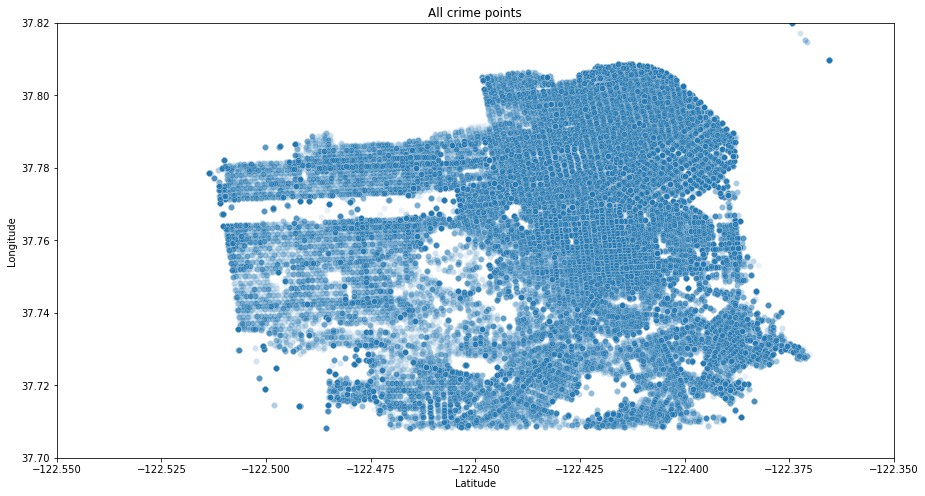

In [118]:
plt.figure(figsize = (15,8))
sns.scatterplot(crime_geo['X'], crime_geo['Y'], alpha=0.1)
plt.xlim(-122.55, -122.35)
plt.ylim(37.7, 37.82)
plt.title('All crime points')
plt.xlabel('Latitude')
plt.ylabel('Longitude');

In [62]:
neighb_coord = []
for row in neighb_geo['the_geom']:
    clean_row = row.strip('MULTIPOLYGON (((')
    clean_row = clean_row.strip(')))')
    clean_row = ' ' + clean_row # Putting everything into a uniform string to further split it into a list
    clean_row = clean_row.split(',')
    clean_row = [val.split(' ') for val in clean_row]
    for i in range(len(clean_row)):
        clean_row[i].pop(0)
    clean_row = [list(map(float, val))[::-1] for val in clean_row]
    neighb_coord.append(clean_row)

In [64]:
neighb_geo['lon_lat'] = neighb_coord

In [119]:
# Saturday overnight differentiate by target
sp_sup = crime_geo[(crime_geo['Target'] == 'specialty_support') & (crime_geo['Year'] == 2018) & (crime_geo['Overnight'] == 1) & (crime_geo['DayOfWeek'] == 'Saturday')]
pol = crime_geo[(crime_geo['Target'] == 'police') & (crime_geo['Year'] == 2018) & (crime_geo['Overnight'] == 1) & (crime_geo['DayOfWeek'] == 'Saturday')]
pnu = crime_geo[(crime_geo['Target'] == 'police_non_urgent') & (crime_geo['Year'] == 2018) & (crime_geo['Overnight'] == 1) & (crime_geo['DayOfWeek'] == 'Saturday')]

In [121]:
%%time
# Neighbourhood SF
sf_neighb = folium.Map(location=[37.8, -122.5])
neighb_geo.apply(lambda row:folium.Polygon(locations=[row['lon_lat']], weight=2).add_to(sf_neighb), axis=1)

sf_neighb

CPU times: user 26.1 ms, sys: 3.3 ms, total: 29.4 ms
Wall time: 35.7 ms


In [122]:
%%time
sf_map_1 = folium.Map(location=[37.8, -122.5])

pnu.apply(lambda row:folium.CircleMarker(location=[row['Y'], row['X']], radius=1, color='yellow').add_to(sf_map_1), axis=1)
sp_sup.apply(lambda row:folium.CircleMarker(location=[row['Y'], row['X']], radius=1, color='green').add_to(sf_map_1), axis=1)
pol.apply(lambda row:folium.CircleMarker(location=[row['Y'], row['X']], radius=1, color='red').add_to(sf_map_1), axis=1)

neighb_geo.apply(lambda row:folium.Polygon(locations=[row['lon_lat']], weight=2).add_to(sf_map_1), axis=1)

sf_map_1

CPU times: user 324 ms, sys: 31 ms, total: 355 ms
Wall time: 475 ms


In [123]:
%%time
sf_map_3 = folium.Map(location=[37.8, -122.5])
crime_geo[crime_geo['Category'] == 'DRUG/NARCOTIC'].apply(lambda row:folium.CircleMarker(location=[row['Y'], row['X']], radius=1, color='red').add_to(sf_map_3), axis=1)
neighb_geo.apply(lambda row:folium.Polygon(locations=[row['lon_lat']], weight=2).add_to(sf_map_3), axis=1)

sf_map_3

CPU times: user 399 ms, sys: 39.3 ms, total: 438 ms
Wall time: 517 ms
